# ロジスティック回帰を解いてみる（おまけ）

番外編です．
確率的識別モデルであるロジスティック回帰を解いてます．
ただし，sklearn パッケージのちからを借りずフルスクラッチで，IRLSを使って解いてみます．

普通は sklearn でお手軽に解くので，こんな苦労はしなくてもよいですが，メカニズムが知りたい人はどうぞ

In [36]:
# いつもの

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
import seaborn as sns; sns.set()

sns.set_context('talk')

# pcolormesh と pcolor の deprecated 問題を封じておく
plt.rcParams['axes.grid'] = False

plt.rcParams['font.size'] = 20
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['image.cmap'] = 'plasma'

# 共通のパラメータを設定しておく
np.random.seed(12345) #乱数シード固定


(-2.0, 6.0)

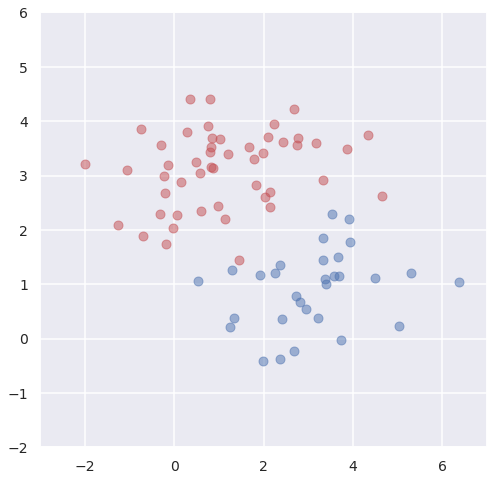

In [37]:
# まずはデータ生成から．
# ここでは２次元のガウス分布としてサンプルをばらまくので
# np.random.multivariate_normal() を使う

mu1 = np.array([1, 3])  # クラス1の中心
mu2 = np.array([3, 1])  # クラス2の中心
cov = 2 *np.array([[1.0,0.2], [0.2, 0.3]])  # 共分散行列（全クラス共通）
cov1 = cov2 = cov

N1 = 50
N2 = 30

x1 = np.random.multivariate_normal(mu1, cov1, N1)
x2 = np.random.multivariate_normal(mu2, cov2, N2)
x = np.vstack((x1, x2))

# ラベルは±1 ￥を張り付けておく
y1 = np.ones(N1)
y2 = -np.ones(N2)
y = np.hstack((y1, y2))


plt.figure(figsize=(8, 8))
plt.plot(x[y==1, 0], x[y==1, 1], 'ro', alpha=0.5)
plt.plot(x[y==-1, 0], x[y==-1, 1], 'bo', alpha=0.5)


plt.grid()
plt.xlim(-3, 7)
plt.ylim(-2, 6)

In [38]:
# 関数群の定義

def logistic(x):
    '''ロジスティック関数'''
    return 1/(1+np.exp(-x))


def yprob(x, w):
    '''
    D入力，１出力
    面倒なので，w は，(w0, w1, ...., wD) な D+1 次元ベクトル
    x は，N 個の入力を取り扱えるようにしておくので(N, D)な行列
    '''
    # x の最初の列に 1 からなるN行ベクトルを付け加えてｗを適正に扱えるようにしておく
    N = x.shape[0]
    xnew = np.hstack((np.ones((N, 1)), x))
    
    return logistic(xnew @ w)


def Ep(w, x, t):
    '''コスト関数の定義'''
    # x の最初の列に 1 からなるN行ベクトルを付け加えてｗを適正に扱えるようにしておく
    eps = 1e-15
    tnew = (t + 1) / 2  # ラベルを (0, 1) に変更
    y = yprob(x, w)
    return -np.sum(tnew * np.log(y+eps) + (1-tnew) * np.log(1-y+eps))


def update_w(w, x, t):
    
    # x の最初の列に 1 からなるN行ベクトルを付け加えてｗを適正に扱えるようにしておく
    N = x.shape[0]
    Phi = np.hstack((np.ones((N, 1)), x))
    tnew = (t + 1) / 2  # ラベルを (0, 1) に変更

    y = yprob(x, w)
    grad = Phi.T @ (y-tnew)
    rr = y * (1-y)
    R = np.diag(rr)
    Hesse = Phi.T @ R @ Phi
    diff = np.linalg.solve(Hesse, Phi.T @ (y-tnew))
    
    return sum(grad**2), w - diff


def drawprob(w, xrng=(0, 1), yrng=(0, 1)):
    # w0 + w1 x1 + w2 x2 = 0 が分離境界のはずなので
    # x2 = (w0 + w1 x1) / (-w2) が境界線
    xx1 = np.linspace(xrng[0], xrng[1])
    xx2 = (w[0] + w[1] * xx1) / (-w[2])
    
    xx, yy = np.meshgrid(np.linspace(xrng[0], xrng[1], 256),
                         np.linspace(yrng[0], yrng[1], 256))
    meshdat = np.c_[xx.ravel(), yy.ravel()]
    Z = yprob(meshdat, w)
    Z = Z.reshape(xx.shape)
    
    plt.pcolormesh(xx, yy, Z, cmap='jet', norm=colors.Normalize(0., 1.), zorder=0, alpha=0.4)
    im = plt.contour(xx, yy, Z, [0.5], linewidths=2., colors='white')
   
    # im = plt.plot(xx1, xx2, 'g-', linewidth=3)
    
    return im

In [39]:
w = np.random.uniform(low=-1, high=1, size=3)

Et = []
# ニュートン法で回を求める
for n in range(20):
    g2, w = update_w(w, x, y)
    print('Epoch:{:02d}'.format(n+1), g2, Ep(w, x, y))
    Et.append(Ep(w, x, y))
    if g2 < 1e-12:
        break


Epoch:01 13440.024353665818 43.58818226544399
Epoch:02 3629.1770642643496 32.19263436373356
Epoch:03 2966.041074391475 12.824179532598137
Epoch:04 141.76210818190643 7.522111834231972
Epoch:05 18.179213136024757 5.231770180158526
Epoch:06 2.6167991035285416 4.218634096470164
Epoch:07 0.49321089905674353 3.7786554817630513
Epoch:08 0.1121297194684431 3.56931549959101
Epoch:09 0.019430252782300848 3.4658478354591873
Epoch:10 0.0016411646805671591 3.4318886816617935
Epoch:11 0.0008109376957276442 3.4284813974178565
Epoch:12 2.813546100711944e-05 3.428448077777451
Epoch:13 4.451076790683334e-09 3.428448074415957
Epoch:14 5.089710890181162e-17 3.4284480744159556


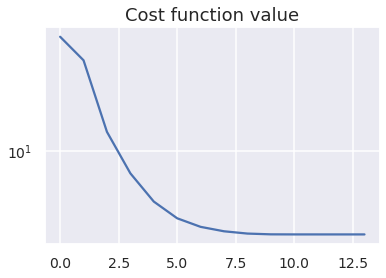

In [40]:

plt.title('Cost function value')
plt.grid()
plt.semilogy(Et)

In [41]:
print(w / np.sqrt(w @ w))

[-0.68556789 -0.23944049  0.6875063 ]


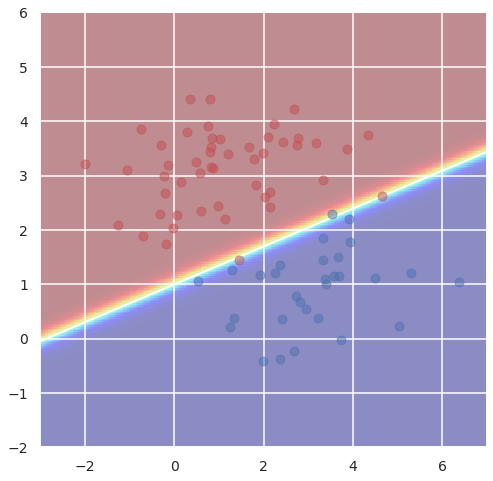

In [42]:
fig = plt.figure(figsize=(8, 8))
plt.xlim(-3, 7)
plt.ylim(-2, 6) 

drawprob(w, xrng=(-3, 7), yrng=(-2, 6))

# データ点の描画
plt.plot(x[y==1, 0], x[y==1, 1], 'ro', alpha=0.5)
plt.plot(x[y!=1, 0], x[y!=1, 1], 'bo', alpha=0.5)

plt.grid()
